__Title:__ Lab 3: Clustering, Association Rules, or Recommenders  
__Authors:__ Butler, Derner, Holmes, Traxler  
__Date:__ 4/9/23

## Ruberic

| Category                  | Available | Requirements                                                                                                                                                                                                                                                                                                                                                                                                                                                       |
|---------------------------|-----------|--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------|
| Total Points              | 100       |                                                                                                                                                                                                                                                                                                                                                                                                                                                                    |
| Business Understanding 1  | 10        | Describe the purpose of the data set you selected (i.e., why was this data collected in the first place?). How will you measure the effectiveness of a good algorithm? Why does your chosen validation method make sense for this specific dataset and the stakeholders needs?                                                                                                                                                                                     |
| Data Understanding 1      | 10        | Describe the meaning and type of data (scale, values, etc.) for each attribute in the data file. Verify data quality: Are there missing values? Duplicate data? Outliers? Are those mistakes? How do you deal with these problems?                                                                                                                                                                                                                                 |
| Data Understanding 2      | 10        | Visualize the any important attributes appropriately. Important: Provide an interpretation for any charts or graphs.                                                                                                                                                                                                                                                                                                                                               |
| Modeling and Evaluation 1 | 10        | Train and adjust parameters                                                                                                                                                                                                                                                                                                                                                                                                                                        |
| Modeling and Evaluation 2 | 10        | Evaluate and Compare                                                                                                                                                                                                                                                                                                                                                                                                                                               |
| Modeling and Evaluation 3 | 10        | Visualize Results                                                                                                                                                                                                                                                                                                                                                                                                                                                  |
| Modeling and Evaluation 4 | 20        | Summarize the Ramifications                                                                                                                                                                                                                                                                                                                                                                                                                                        |
| Deployment                | 10        | Be critical of your performance and tell the reader how you current model might be usable by other parties. Did you achieve your goals? If not, can you reign in the utility of your modeling? How useful is your model for interested parties (i.e., the companies or organizations that might want to use it)? How would your deploy your model for interested parties? What other data should be collected? How often would the model need to be updated, etc.? |
| Exceptional Work          | 10        | You have free reign to provide additional analyses or combine analyses.                                                                                                                                                                                                                                                                                                                                                                                            |

In [69]:
# Import libraries
## Plotting
import plotly.express as px
import plotly.graph_objects as go
import plotly.subplots as sp
import matplotlib.pyplot as plt
import seaborn as sns

## Support Libraries
import pandas as pd
import numpy as np
import warnings
import itertools

## Preprocessing
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer


## Models
from sklearn.decomposition import PCA
from sklearn.cluster import DBSCAN, KMeans

## Model Performance
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score

# Notebook Settings
warnings.filterwarnings('ignore')
pd.set_option('display.max_columns', None)

In [32]:
# Dataset
url = 'https://github.com/cdholmes11/MSDS-7331-ML1-Labs/blob/main/Mini-Lab_LogisticRegression_SVMs/Hotel%20Reservations.csv?raw=true'
hotel_df = pd.read_csv(url, encoding = "utf-8")

# Remap booking status to integer
hotel_df['booking_status'] = np.where(hotel_df['booking_status'] == 'Canceled', 1, 0)

# Notebook Random State
rand_state = 110

## Business Understanding 1
Describe the purpose of the data set you selected (i.e., why was this data collected in the first place?). How will you measure the effectiveness of a good algorithm? Why does your chosen validation method make sense for this specific dataset and the stakeholders needs?

_______________

This data set was published on Kaggle with the purpose of classifying cancellations for hotel reservations. There are 19 features and 36,275 observations across the years 2017 and 2018.

We will be removing the classification column of booking_status from our clustering models to see if these additional clustering groups can help us better classify booking_status. Additionally, it will help us see if there are any underlying clusters in the data that are unrelated to booking_status, but are still related to data the hotel operators would have prior to the stay of the guest.

We will be using Silhouette score to evaluate the performance of our models. Our primary objective is to find underlying clusters in the observations. Our secondary objective is to see if these clusters assist in the main classification task. Silhouette score priorizes the correctness bases on distance from like observations in the cluster and distance away from non-like clustered observations. This makes Silhouette score a great metric for finding like clusters in our model that is based solely on their location in the higher demensional space. Stakeholders will either be able to better predict cancellations, find underlying clusters that inform their business model, or both.

In [33]:
hotel_df.shape

(36275, 19)

## Data Understanding 1
Describe the meaning and type of data (scale, values, etc.) for each attribute in the data file. Verify data quality: Are there missing values? Duplicate data? Outliers? Are those mistakes? How do you deal with these problems?

__________________

- Describe meaning and type of data
- Verify data quality
    - Missing values
    - Duplicate data
    - Outliers
- How to deal with problems 

__Data Meaning & Type__  
These descriptions are sourced from the Kaggle page for this classification data set (Hotel Reservations Dataset, 2023).


| Column                               | Type        | Description                                                                                   |
|--------------------------------------|-------------|-----------------------------------------------------------------------------------------------|
| Booking_ID                           | categorical | Unique identifier of each booking                                                             |
| no of adults                         | integer     | Number of Adults                                                                              |
| no of children                       | integer     | Number of Children                                                                            |
| no_of_weekend_nights                 | integer     | Number of weekend nights (Saturday or Sunday) the guest stayed or booked to stay at the hotel |
| no_of_week_nights                    | integer     | Number of week nights (Monday to Friday) the guest stayed or booked to stay at the hotel      |
| type_of_meal_plan                    | categorical | Type of meal plan booked by the customer                                                      |
| required_car_parking_space           | categorical | Does the customer require a car parking space?                                                |
| room_type_reserved                   | categorical | Type of room reserved by the customer.                                                        |
| lead time                            | integer     | Number of days between the date of booking and the arrival date                               |
| arrival_year                         | integer     | Year of arrival date                                                                          |
| arrival month                        | integer     | Month of arrival date                                                                         |
| arrival date                         | integer     | Date of the month                                                                             |
| market_segment_type                  | categorical | Market segment designation                                                                    |
| repeated_guest                       | categorical | Is the customer a repeated guest?                                                             |
| no_of_previous cancellations         | integer     | Number of previous bookings that were canceled by the customer prior to the current booking   |
| no_of_previous_bookings_not_canceled | integer     | Number of previous bookings not canceled by the customer prior to the current booking         |
| avg_price_per_room                   | float       | Average price per day of the reservation; prices of the rooms are dynamic                     |
| no_of_special_requests               | integer     | Total number of special requests made by the customer                                         |
| booking_status                       | categorical | Flag indicating if the booking was canceled or not                                            |

In [34]:
# Create data type groups
cat_features = ['type_of_meal_plan', 'required_car_parking_space', 'room_type_reserved', 'market_segment_type',
    'repeated_guest', 'booking_status']
int_features = ['no_of_adults', 'no_of_children', 'no_of_weekend_nights', 'no_of_week_nights', 
    'arrival_month', 'arrival_year', 'arrival_date', 'no_of_previous_cancellations', 'no_of_previous_bookings_not_canceled',
    'no_of_special_requests', 'lead_time']
float_features = ['avg_price_per_room']
num_features = int_features + float_features

# Enforce data types
hotel_df[cat_features] = hotel_df[cat_features].astype('category')
hotel_df[int_features] = hotel_df[int_features].astype(np.int64)
hotel_df[float_features] = hotel_df[float_features].astype(np.float64)

__Missing Values__  
There are no missing values in the data set.

In [35]:
# Feature data type
hotel_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 36275 entries, 0 to 36274
Data columns (total 19 columns):
 #   Column                                Non-Null Count  Dtype   
---  ------                                --------------  -----   
 0   Booking_ID                            36275 non-null  object  
 1   no_of_adults                          36275 non-null  int64   
 2   no_of_children                        36275 non-null  int64   
 3   no_of_weekend_nights                  36275 non-null  int64   
 4   no_of_week_nights                     36275 non-null  int64   
 5   type_of_meal_plan                     36275 non-null  category
 6   required_car_parking_space            36275 non-null  category
 7   room_type_reserved                    36275 non-null  category
 8   lead_time                             36275 non-null  int64   
 9   arrival_year                          36275 non-null  int64   
 10  arrival_month                         36275 non-null  int64   
 11  ar

__Duplicate Records__  
There are no duplicate records in the data set.

In [36]:
# Duplicate record validation
hotel_df.duplicated().sum()

0

__Outliers__  
When reviewing outliers for clustering, we've identified rare cateorical levels and numeric with high influence. The following variabbles contained outlier concerns.
 - [no_of_children] - three observations greater than 3 children with values of 9 and 10 children
 - [type_of_meal_plan] - 'Meal Plan 3' has only 5 observations
 - [room_type_reserved] - 'Room_Type 3' has only 7 observations
 - [no_of_previous_bookings_not_canceled] - Significant number of outliers at the upper range.
 - [avg_price_per_room] - only 9 observations over $300

In [37]:
out_list = ['no_of_children', 'type_of_meal_plan', 'room_type_reserved']
for col in out_list:
    print(f'Variable: {col}')
    print(hotel_df[col].value_counts())
    print()

Variable: no_of_children
0     33577
1      1618
2      1058
3        19
9         2
10        1
Name: no_of_children, dtype: int64

Variable: type_of_meal_plan
Meal Plan 1     27835
Not Selected     5130
Meal Plan 2      3305
Meal Plan 3         5
Name: type_of_meal_plan, dtype: int64

Variable: room_type_reserved
Room_Type 1    28130
Room_Type 4     6057
Room_Type 6      966
Room_Type 2      692
Room_Type 5      265
Room_Type 7      158
Room_Type 3        7
Name: room_type_reserved, dtype: int64



In [38]:
# no_of_previous_bookings_not_canceled outliers
fig = px.histogram(
    hotel_df,
    x='no_of_previous_bookings_not_canceled',
    marginal='rug',
    width=1000,
    height=500,
    title='Previous Not Canceled Booking Distribution Plot')
fig.show()

The overwhelming majority of observations have 0 previous cancelations. After that, only 228 observations have 1 previous cancelation. This shows a highly right skewed distribution with many outliers.

In [39]:
# Average Price Per Room Outliers
hotel_df[hotel_df['avg_price_per_room'] > 300].shape

(9, 19)

__How to Deal with Problems__
Since our data has no duplicates or missing values, we are left to handle outliers and unneeded features.

Data set changes
 - [Booking_ID]
    - Dropped because we already have an index column.
 - [arrival_year]
    - Dropped because we want our models to be applicable for future data sets.
    - This will require judgement from end users on when to rerun the model with new data to maintain relevance.   
 - [no_of_children]
    - Limiting scope to 3 children and under
 - [type_of_meal_plan]
    - 'Removing Meal Plan 3
 - [room_type_reserved]
    - Removing Room_Type 3
 - [no_of_previous_bookings_not_canceled]
   - From our previous analysis (Butler et al., n.d.), we found that [no_of_previous_bookings_not_canceled] had high coorelation with [repeated_guest].
   - Given the high number of outliers and colinearity with [repeated_guest], we decided to drop it from the data set.
 - [avg_price_per_room]
   - Limiting scope to observations under $300

In [40]:
# Dropping index column arrival_year
hotel_df_trim = hotel_df.drop(['Booking_ID', 'arrival_year', 'no_of_previous_bookings_not_canceled'], axis=1)

# Limited Scope filters
a = hotel_df_trim['no_of_children'] <= 3
b = hotel_df_trim['type_of_meal_plan'] != 'Meal Plan 3'
c = hotel_df_trim['room_type_reserved'] != 'Room_Type 3'
d = hotel_df_trim['avg_price_per_room'] <= 300

hotel_df_final = hotel_df_trim.loc[a & b & c & d]

X = hotel_df_final.drop('booking_status', axis=1)
Y = hotel_df_final['booking_status']

# Update data type lists
int_features.remove('arrival_year')
int_features.remove('no_of_previous_bookings_not_canceled')
num_features = int_features + float_features

# Making indexable list suitable for pipeline
cat_features_final = list(hotel_df_final[cat_features].columns)
num_features_final = list(hotel_df_final[num_features].columns)

In [41]:
# Pipeline - Classification without booking_status
numeric_features = num_features_final
numeric_transformer = Pipeline(
    steps=[("scaler", StandardScaler())]
)

categorical_features = [x for x in cat_features_final if x != 'booking_status']
categorical_transformer = Pipeline(
    steps=[
        ("encoder", OneHotEncoder(handle_unknown="ignore"))
    ]
)
preprocessor = ColumnTransformer(
    transformers=[
        ("num", numeric_transformer, numeric_features),
        ("cat", categorical_transformer, categorical_features),
    ]
)

## Data Understanding 2
Visualize the any important attributes appropriately. Important: Provide an interpretation for any charts or graphs.

________________________

Given the unsupervised nature of clustering algorithms, we've attempted to utilize this section to explore potential trends that will be helpful in making inferences about the clusters of our future models.

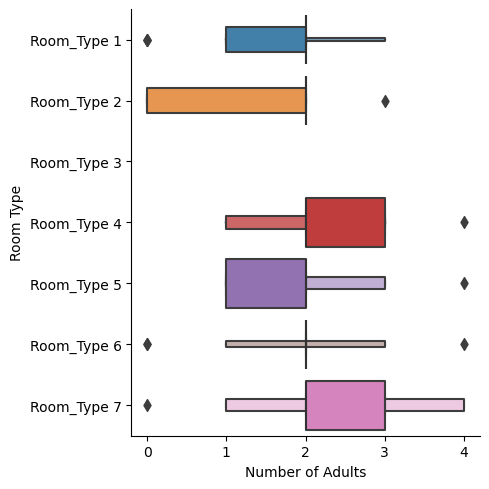

In [42]:
# Exploring new variables
hotel_df2 = hotel_df_final.copy()
hotel_df2['total_guests'] = hotel_df2.loc[:,['no_of_adults','no_of_children']].sum(axis=1)
df_to_use = hotel_df2[["room_type_reserved", "no_of_adults","no_of_children","total_guests"]]
df_to_use = pd.DataFrame(df_to_use)

#All Graphs Comparing Room Type by guest amount
sns.catplot(data= df_to_use, y = 'room_type_reserved', x = 'no_of_adults',kind = 'boxen', legend = True).set(xlabel = 'Number of Adults',ylabel = 'Room Type')
plt.show()

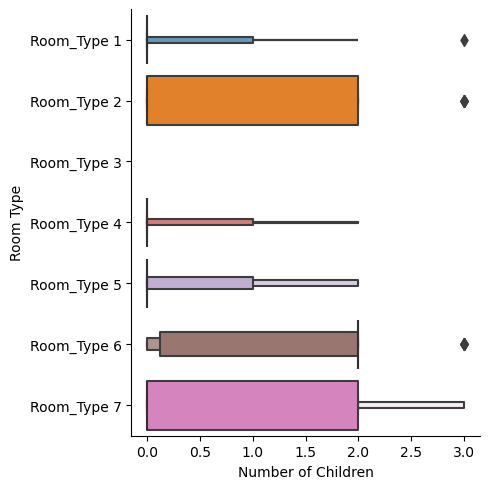

In [43]:
sns.catplot(data= df_to_use, y = 'room_type_reserved', x = 'no_of_children',kind = 'boxen', legend = True).set(xlabel = 'Number of Children',ylabel = 'Room Type')
plt.show()

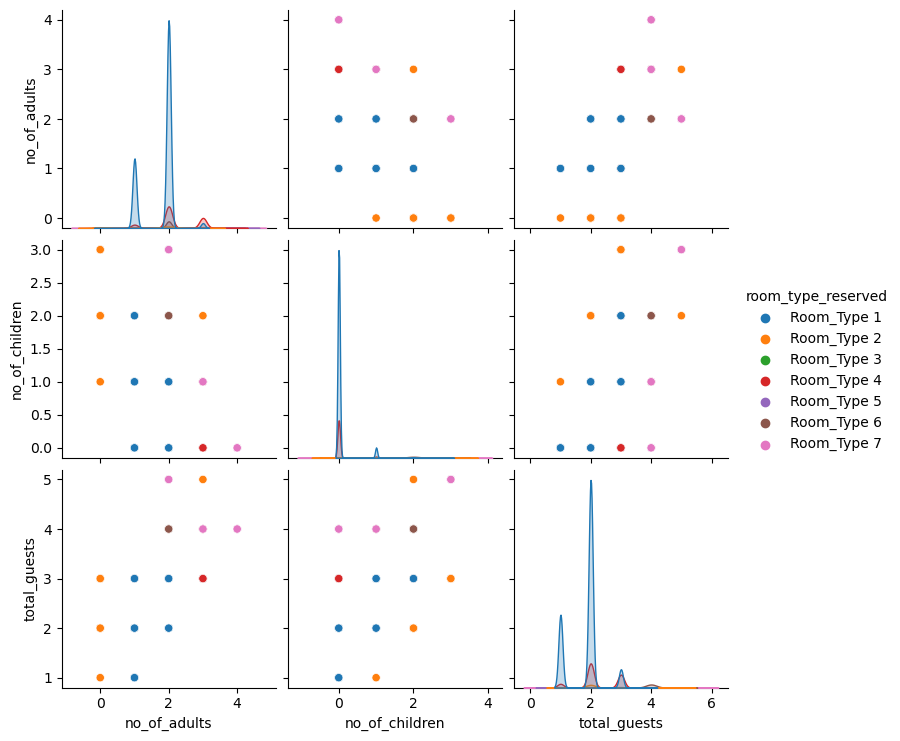

In [44]:
sns.pairplot(df_to_use, hue = 'room_type_reserved')
plt.show()

We can infer from the charts above that Room Types 4 and 7, especially 7 are reserved more by adults without kids than those with children. Conversely, room types 4 and 2 are reserved by adults with children.

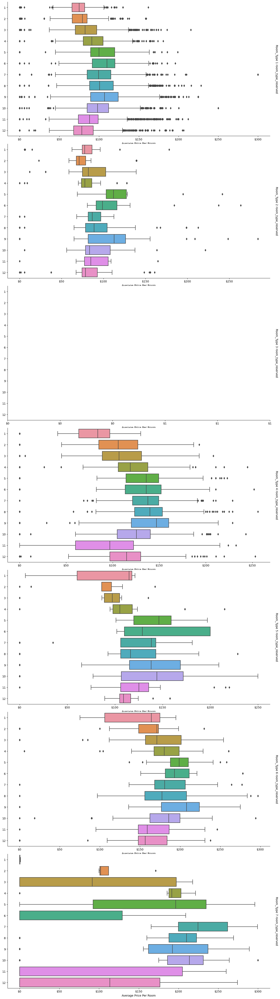

In [45]:
# Graphs showing Average Price by Month per Room by Room Type
df3 = hotel_df_final[['avg_price_per_room','arrival_month','room_type_reserved']]
g = sns.catplot(data =df3, y = 'arrival_month',x = 'avg_price_per_room', row = 'room_type_reserved', kind = 'box',orient = 'h',sharex = False,
           margin_titles = True,
           height =7, aspect = 2)

g.set(xlabel="Average Price Per Room", ylabel="")
g.set_titles(row_template="{row_name} room_type_reserved")
for ax in g.axes.flat:
    ax.xaxis.set_major_formatter('${x:.0f}')
plt.show()

From the charts above it is clear that Room types 1 and 2 are consistently priced at $100 year round whereas Rooms 4,and 5 are consistently priced between $125-$150 a night. Room Types 6 and 7 apppear to be the most expensive during the summer months, but may have steep discounts throughout the remainder of the year. Room Type 3 appears to have only seasonal availability or be secluded for special events. Given how few data points are recorded for Room Type 3, we would want to further investigate this to detemine the viability of using Room Type 3. 

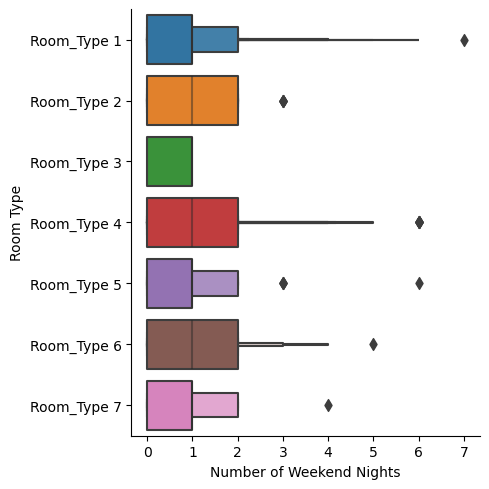

In [46]:
#All Graphs Number of Week nights vs Weekend by Room Type
df_to_use2 = hotel_df_trim[["room_type_reserved", 'no_of_weekend_nights','no_of_week_nights']]
sns.catplot(data= df_to_use2, y = 'room_type_reserved', x = 'no_of_weekend_nights',kind = 'boxen', legend = True).set(xlabel = 'Number of Weekend Nights',ylabel = 'Room Type')
plt.show()

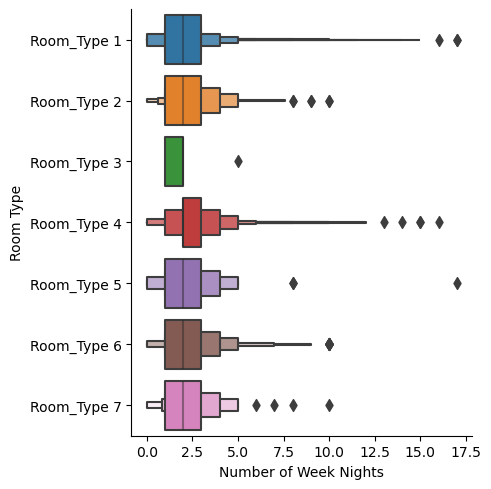

In [47]:
sns.catplot(data= df_to_use2, y = 'room_type_reserved', x = 'no_of_week_nights',kind = 'boxen', legend = True).set(xlabel = 'Number of Week Nights',ylabel = 'Room Type')
plt.show()

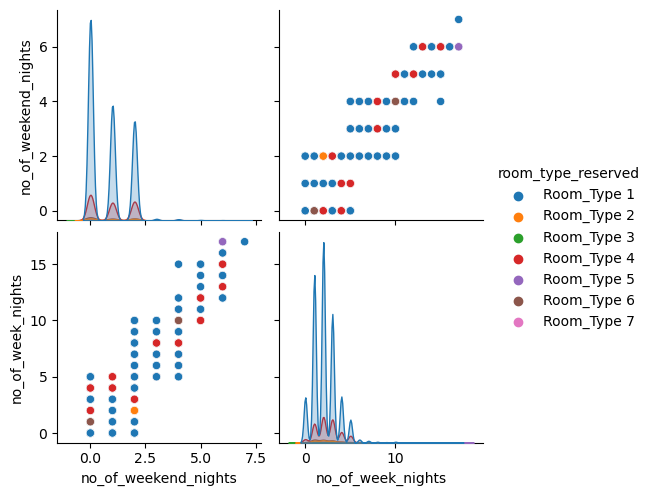

In [48]:
sns.pairplot(df_to_use2,hue = 'room_type_reserved')
plt.show()

From the charts above we are able to see that Room Types 1,4, and 6 are reserved the most on weekends and weeknights while Room Type 3 appears to be more for special occasions or events. It would be worth investigating the distribution of purchases by room type to better determine if there's an imbalance in the data.

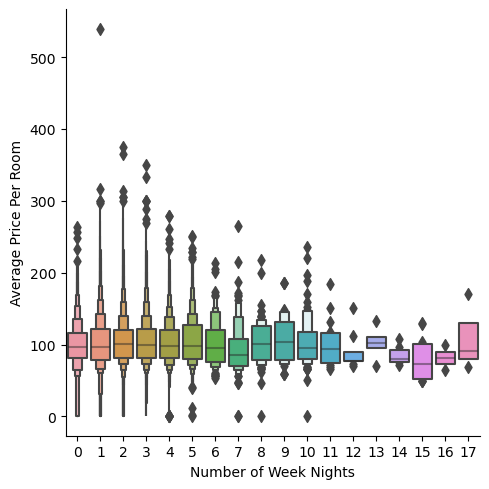

In [49]:
#Comparing Cost of Room Type by Weekend or Weeknight stay
df4= hotel_df_trim[["avg_price_per_room", 'no_of_weekend_nights','no_of_week_nights']]
sns.catplot(data= df4, x = 'no_of_week_nights',y = 'avg_price_per_room',kind = 'boxen', legend = True).set(xlabel = 'Number of Week Nights',ylabel = 'Average Price Per Room')
plt.show()

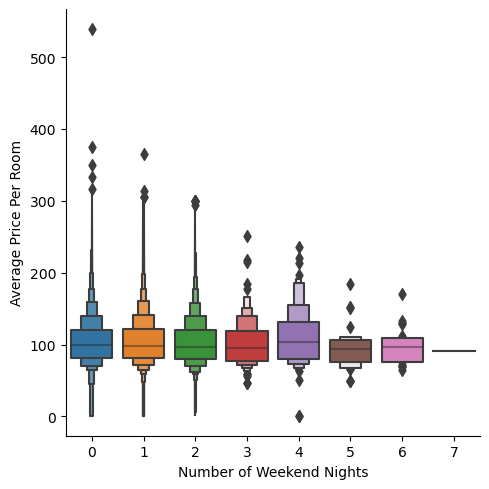

In [50]:
sns.catplot(data= df4, x = 'no_of_weekend_nights',y = 'avg_price_per_room',kind = 'boxen', legend = True).set(xlabel = 'Number of Weekend Nights',ylabel = 'Average Price Per Room')
plt.show()

Analyzing the charts above, we are able to determine that the price is relatively more expensive staying between 1-2 days on the weekend whereas the price during the week appears to be more stable. It's interesting to see number of weekend nights go above 3 since there are only 3 days to the weekend if including Friday Night.

## Modeling and Evaluation 1
Train and adjust parameters

In [51]:
# Basic DBSCAN
dbscan_pipe = Pipeline([
    ('preprocessing', preprocessor),
    ('pca', PCA(n_components=3)),
    ('clustering', DBSCAN())
    ]
)

dbscan_pipe.fit(X)
cluster_labels = dbscan_pipe.named_steps['clustering'].labels_

processed_data = dbscan_pipe['preprocessing'].transform(X)
pca_data = dbscan_pipe.named_steps['pca'].transform(processed_data)


silscore_basic = silhouette_score(processed_data, cluster_labels)
print(f'Silhouette Score: {silscore_basic:.4f}')

data_with_clusters1 = pd.concat([
    X.reset_index(drop=True),
    pd.DataFrame(pca_data, columns=['PC1', 'PC2', 'PC3']),
    pd.DataFrame({'DBSCAN_Basic': cluster_labels})
], axis=1)

Silhouette Score: 0.0783


In [52]:
# 3D plot of first three components and cluster for basic model
fig = px.scatter_3d(
    data_with_clusters1,
    x = 'PC1',
    y = 'PC2',
    z = 'PC3',
    width=1000,
    height=500,
    title='Principle Components')
fig.show()

The basic bodel with all default settings has a terrible silhouette score. Visualizating the principle components reveals there is an underlying cluster that our model is not finding. In the following model, we tuned the hyperperameters to isolate these twp distinct groups.

In [53]:
# Optimized DBSCAN
dbscan_pipe = Pipeline([
    ('preprocessing', preprocessor),
    ('pca', PCA(n_components=3)),
    ('clustering', DBSCAN(eps=2.5, min_samples=20, metric='euclidean'))
    ]
)

dbscan_pipe.fit(X)

# Cluster Labels
cluster_labels = dbscan_pipe.named_steps['clustering'].labels_

# Manual Pipeline calls
processed_data = dbscan_pipe['preprocessing'].transform(X)
pca_data = dbscan_pipe.named_steps['pca'].transform(processed_data)

# Silhouette Metric
silscore_opt = silhouette_score(processed_data, cluster_labels)
print(f'Silhouette Score: {silscore_opt:.4f}')

# New Data Frame for PCA and cluster labels
data_with_clusters2 = pd.concat([
    hotel_df_final.reset_index(drop=True),
    pd.DataFrame(pca_data, columns=['PC1', 'PC2', 'PC3']),
    pd.DataFrame({'DBSCAN': cluster_labels})
], axis=1)

Silhouette Score: 0.8572


This model had a significantly higher Silhouette Score from the basic DBSCAN model. We believe this is likely to have clustered the two groups we saw in the three demensional principle component plot above. We will explore this further in the visualization section.

## Modeling and Evaluation 2
Evaluate and Compare

______________


Now that we've found a model with a good silhouette score, we want to explore the underlying weights of each principle component and the details of the clustered groups to see if we can glean any information that would be benefitial to either hotel operators or customers.

__Comparison__

In [54]:
# Model Comparison
score_comparison = pd.DataFrame({
    'Model':['Basic', 'Optimized'],
    'Silhouette Score': [round(silscore_basic, 4), round(silscore_opt, 4)]
})

score_comparison

,Model,Silhouette Score
0,Basic,0.0783
1,Optimized,0.8572


As stated previously, the optimized model greatly outperforms the basic model.

__Evaluate__

In [55]:
# Clustered group counts
data_with_clusters2['DBSCAN'].value_counts()

0    36222
1       29
Name: DBSCAN, dtype: int64

In [56]:
# PCA weights by feature
feature_names = X.columns.tolist()
pca_weights = dbscan_pipe.named_steps['pca'].components_.T

# create dictionary mapping feature names to weights for first principal component
pca_weights_by_feature = (
    pd.DataFrame(dict(zip(feature_names, pca_weights)))
        .T.sort_values(0, ascending=False)
        .rename(columns={0:'PC 1', 1:'PC 2', 2:'PC 3'})
)
pca_weights_by_feature

,PC 1,PC 2,PC 3
arrival_date,0.557737,-0.165595,-0.169121
lead_time,0.428575,-0.096722,0.000683
no_of_adults,0.427644,0.245695,0.053474
no_of_children,0.374187,-0.264527,-0.091729
no_of_week_nights,0.173315,0.490742,0.264820
no_of_weekend_nights,0.168192,0.344280,0.530086
type_of_meal_plan,0.101270,0.259060,-0.616364
required_car_parking_space,0.055407,-0.018368,0.296990
market_segment_type,0.019489,-0.006515,0.032538
no_of_special_requests,0.008783,-0.015556,-0.000419


Above, we show the weights for each principle component to try and see which features are driving this group of 29 observations that is unlike any other reservation in our data set.

Looking at the below value counts for the columns with potential high influence, a couple things stand out.
 - [lead_time] is typically short.
 - [no_of_adults] is mostly 2.
 - [no_of_children] is always 0.
 - [arrival_month] is almost all in January.
 - [no_of_week_nights] is typically less than 2 nights.
 - [no_of_weekend_nights] is mostly 0 nights and some 1 night.

In [57]:
# Average room price comparison
dbscan_price_average = data_with_clusters2[data_with_clusters2['DBSCAN'] == 1]['avg_price_per_room'].mean()
sample_price_average = data_with_clusters2['avg_price_per_room'].mean()

print('Average price per room:')
print(f'  DBSCAN cluster 1 - ${dbscan_price_average:.2f}')
print(f'  Entire sample -  ${sample_price_average:.2f}')

Average price per room:
  DBSCAN cluster 1 - $80.92
  Entire sample -  $103.38


Average price per room was low on the component weights, but we did find an observed difference between the sample and cluster group 1.

In [58]:
# High weight principle component features
col_list = ['arrival_date', 'lead_time', 'no_of_adults', 'no_of_children', 'arrival_month', 'no_of_week_nights', 'no_of_weekend_nights']
for col in col_list:
    print(f'Variable: {col}')
    print(data_with_clusters2[data_with_clusters2['DBSCAN'] == 1][col].value_counts())
    print()

Variable: arrival_date
15    5
9     5
14    4
12    3
16    2
13    2
8     2
10    1
17    1
29    1
22    1
5     1
7     1
Name: arrival_date, dtype: int64

Variable: lead_time
1      7
190    4
0      3
5      3
2      3
4      3
3      2
8      2
10     1
12     1
Name: lead_time, dtype: int64

Variable: no_of_adults
2    22
1     6
3     1
Name: no_of_adults, dtype: int64

Variable: no_of_children
0    29
Name: no_of_children, dtype: int64

Variable: arrival_month
1    21
2     4
4     4
Name: arrival_month, dtype: int64

Variable: no_of_week_nights
1    16
2    10
3     2
0     1
Name: no_of_week_nights, dtype: int64

Variable: no_of_weekend_nights
0    19
1     8
2     2
Name: no_of_weekend_nights, dtype: int64



While this cluster is too small to really help us classify booking_status, we did want to see how the booking_status classification compared against the population. What we found is that those associated with cluster group 1 only canceled their reservations 0.01% of the time. This compared to a sample cancelation rate of 32.74%. This is a staggering retention rate for this subset of the sample and only reinforces the need to find additional information on these observations that can assist hotel operators in replicating the criteria that created this cluster of observations.

In [59]:
# Cancelation Rate comparison
df1 = pd.DataFrame(data_with_clusters2['booking_status'].value_counts()).T
df2 = pd.DataFrame(data_with_clusters2[data_with_clusters2['DBSCAN'] == 1]['booking_status'].value_counts()).T.rename(index={'booking_status':'DBSCAN'})

df3 = pd.concat([df1, df2]).rename(columns={0:'Not Canceled', 1:'Canceled'}).rename(index={'booking_status':'Sample'})
df3['Cancelation Percentage'] = round(df3['Canceled']/sum(df3['Canceled'] + df3['Not Canceled'])*100,2)
df3

,Not Canceled,Canceled,Cancelation Percentage
Sample,24374,11877,32.74
DBSCAN,25,4,0.01


## Modeling and Evaluation 3
Visualize Results

In [60]:
# 3D plot of first three components and cluster for basic model
fig = px.scatter_3d(
    data_with_clusters1,
    x = 'PC1',
    y = 'PC2',
    z = 'PC3',
    color='DBSCAN_Basic',
    width=1000,
    height=500,
    title='Basic DBSCAN Cluster')
fig.show()

Once we plot the clusters from our basic model, we can see why the silhouette score was so low. It neither isolated the smatt distinct group or has any noticable logic to the clustering of the large group.

In [61]:

# 3D plot of first three components and cluster
fig = px.scatter_3d(
    data_with_clusters2,
    x = 'PC1',
    y = 'PC2',
    z = 'PC3',
    color='DBSCAN',
    width=1000,
    height=500,
    title='Optimized DBSCAN Cluster')
fig.show()

As expected from the very good silhouette score, our optimized model was able to create two clusters that isolated the observed masses.

In [62]:
# Bar plot of performance
fig = px.bar(
    score_comparison,
    x='Silhouette Score',
    y='Model',
    width=1000,
    height=500,
    title='Model Performance Comparison',
    text='Silhouette Score')
fig.update_xaxes(range=[0, 1],)
fig.show()

Our optimized model accurately clusters the isolated groups and has a silhoutte score nearly 11 times higher.

## Modeling and Evaluation 4
Summarize the Ramifications
_______

Our best description of cluster group 1 would be couples booking short weekday trips in January with little lead time and no kids. Even though [avg_price_per_room] was not weighted heavily in any of the principle components, we did observe that these reservations were about $20 less than the average price per room for the entire sample. Our hypothesis is that these reservations are associated with a limited promotion that we don't have visibility to. To have a more informed hypothesis, we would need data related to the hotel these reservations are to or access to someone with more domain knowledge.

We believe that if this data can be connected to a particular promotion, that hotel operators can potentially utilize the marketing strategies that drove these particular customers to stay with them. Alternatively, it appears that customers who are willing to last-minute book during the weekdays of January have the opportunity to get much lower hotel prices.

## Deployment
Be critical of your performance and tell the reader how you current model might be usable by other parties. Did you achieve your goals? If not, can you reign in the utility of your modeling? How useful is your model for interested parties (i.e., the companies or organizations that might want to use it)? How would your deploy your model for interested parties? What other data should be collected? How often would the model need to be updated, etc.?

____

While we were unable to find clustering groups that improved our ability to better or more efficiently classify cancelation status, we were able to find an underlying cluster that has the potential to help the business better understand their client behavior. We believe with some additional information about these observations or the insight of someone with more domain knowledge, we could provide hotel operators with insightful information about potential promotions they could run to drive traffic that has a low cancelation rate. Specific information about the hotels related to the stays or advertising campaigns would potentially provide the insight needed to explain the underlying clusters found in the data set. Ultimately, the unsupervised nature of our model makes it very difficult to make assumptions or recommendations with confidence. It further complicates the confidence in our ability for the model to be used on future data sets without adjustment.

Our current data set is from the years 2017 and 2018. We removed year from the model to make it applicable for future years. This, however, will require the end user to make the determination on when to update the training dataset with more current data. Given the clustering algorithm was tuned to particularly identify the distinct cluster shown in the three dimensional plot of the first three principle components, our model would likely need further tuning to identify the particular distribution of future data sets. That being said, the workflow was designed to be as dynamic as possible for future data sets. Given the same features, the pipeline we designed to handle data pre-processing can be easily used to run other clustering algorithms or classification models. We believe the dynamic nature of our model would make it highly appealing to companies or organizations in this field.

Deploying this model can be as easy as copying the code and changing the data source. It can also be made to scale by hosting it in a cloud solution and updating the data source to feed from a user defined data set. If the features have different names, but the same content, we could provide a mapping tool to ensure coehesion.

## Exceptional Work
You have free reign to provide additional analyses or combine analyses.

In the case of our Hotel Reservations dataset, we are interested in segmenting customers based on their booking behavior, this lead us to cluster based on lead time (the time between booking and arrival). We wanted to see if certain types of customers book well in advanced vs last minute. 

Since examining only customers who booked a hotel room we will remove cancelled bookings since they don't represent completed bookings. We'll standarize the data using 'StandardScaler()' so that the lead time values are on the same scale as the booking status values and are easily plottable. 

For evaluating the model we initially decided to use a visual method and decided on plotting an elbow chart to determine the optimal number of clusters. Fitting K-Means clustering models with different numbers of clusters and plot the within-cluster sum of squares (WCSS) for each model. We choose the number of clusters where the decrease in WCSS begins to level off, which in this case appears to be 3

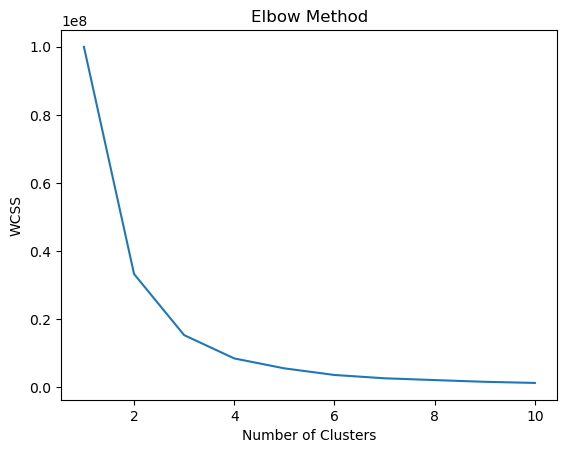

In [63]:
# Preprocessing
df = hotel_df_final[hotel_df_final['booking_status'] == 0]  # only keep non-canceled bookings
X2 = df[['lead_time']].values  # cluster on lead time

# Elbow method
wcss = []
for i in range(1, 11):
    kmeans = KMeans(n_clusters=i, init='k-means++', random_state=42)
    kmeans.fit(X2)
    wcss.append(kmeans.inertia_)
plt.plot(range(1, 11), wcss)
plt.title('Elbow Method')
plt.xlabel('Number of Clusters')
plt.ylabel('WCSS')
plt.show()

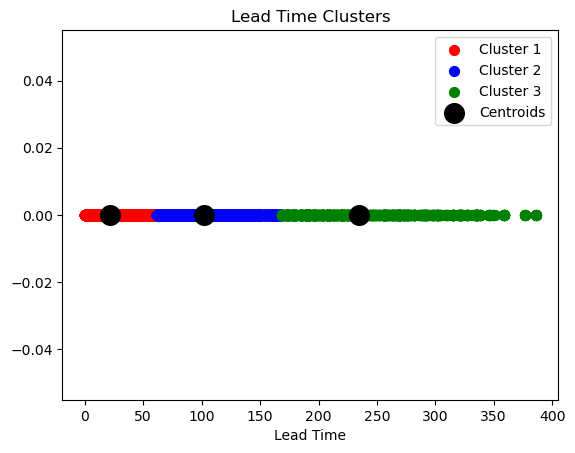

In [64]:
# Fit model
kmeans = KMeans(n_clusters=3, init='k-means++', random_state=42)
y_pred = kmeans.fit_predict(X2)

# Visualize clustering results
plt.scatter(X2[y_pred == 0, 0], [0]*sum(y_pred == 0), s=50, c='red', label='Cluster 1')
plt.scatter(X2[y_pred == 1, 0], [0]*sum(y_pred == 1), s=50, c='blue', label='Cluster 2')
plt.scatter(X2[y_pred == 2, 0], [0]*sum(y_pred == 2), s=50, c='green', label='Cluster 3')
plt.scatter(kmeans.cluster_centers_[:, 0], [0]*len(kmeans.cluster_centers_), s=200, c='black', label='Centroids')
plt.title('Lead Time Clusters')
plt.xlabel('Lead Time')
plt.legend()
plt.show()

In [65]:
# Silhouette score
silhouette_avg = silhouette_score(X2, y_pred)
print(f"The average silhouette_score is : {silhouette_avg:.4f}")

# Calinski-Harabasz Index
ch_score = calinski_harabasz_score(X2, y_pred)
print(f"Calinski-Harabasz Index is: {ch_score:.4f}")

# Davies-Bouldin Index
db_score = davies_bouldin_score(X2, y_pred)
print(f"Davies-Bouldin Index is: {db_score:.4f}")

The average silhouette_score is : 0.6401
Calinski-Harabasz Index is: 67169.6924
Davies-Bouldin Index is: 0.5072


Examming the fit of the K-Means clustering model with 3 clusters and visualizing the clusters by plotting the lead time values against the booking status values, the resulting plot shows that there are three distinct groups of customers based on their lead time and booking status. Since we have only 3 clusters, the Silhouette score may not be very informative. If we had more clusters, the Silhouette score could be more useful for evaluating the quality of the clustering results.

__Optimizing the model__

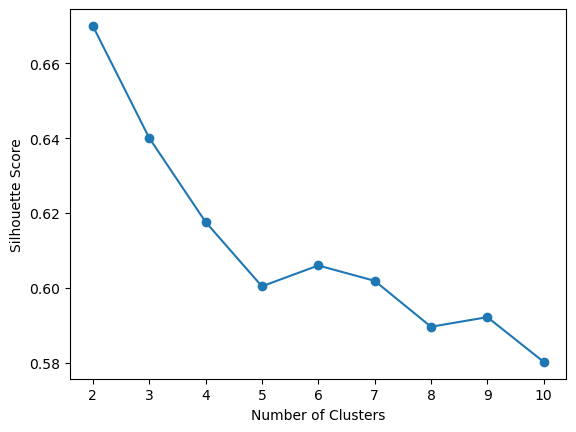

In [66]:
# Preprocessing
df = hotel_df_final[hotel_df_final['booking_status'] == 0]  # only keep non-canceled bookings
X2 = df[['lead_time']].values  # cluster on lead time

# Optimize number of clusters
scores = []
for n_clusters in range(2, 11):
    kmeans = KMeans(n_clusters=n_clusters, init='k-means++', random_state=42)
    y_pred = kmeans.fit_predict(X2)
    silhouette_avg = silhouette_score(X2, y_pred)
    scores.append(silhouette_avg)
    
# Plot silhouette scores
plt.plot(range(2, 11), scores, marker='o')
plt.xlabel('Number of Clusters')
plt.ylabel('Silhouette Score')
plt.show()

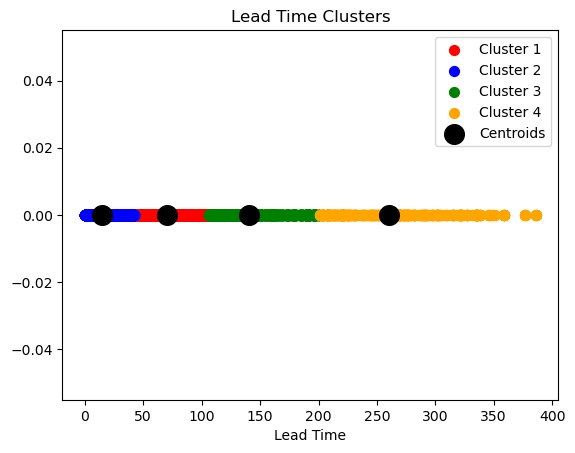

In [67]:
# Fit model with optimized number of clusters
n_clusters = 4  # choose number of clusters based on silhouette score plot
kmeans = KMeans(n_clusters=n_clusters, init='k-means++', random_state=42)
y_pred = kmeans.fit_predict(X2)

# Visualize clustering results
plt.scatter(X2[y_pred == 0, 0], [0]*sum(y_pred == 0), s=50, c='red', label='Cluster 1')
plt.scatter(X2[y_pred == 1, 0], [0]*sum(y_pred == 1), s=50, c='blue', label='Cluster 2')
plt.scatter(X2[y_pred == 2, 0], [0]*sum(y_pred == 2), s=50, c='green', label='Cluster 3')
plt.scatter(X2[y_pred == 3, 0], [0]*sum(y_pred == 3), s=50, c='orange', label='Cluster 4')
plt.scatter(kmeans.cluster_centers_[:, 0], [0]*len(kmeans.cluster_centers_), s=200, c='black', label='Centroids')
plt.title('Lead Time Clusters')
plt.xlabel('Lead Time')
plt.legend()
plt.show()

In [68]:
# Silhouette score
silhouette_avg = silhouette_score(X2, y_pred)
print(f"The average silhouette_score is : {silhouette_avg:.4f}")

# Calinski-Harabasz Index
ch_score = calinski_harabasz_score(X2, y_pred)
print(f"Calinski-Harabasz Index is: {ch_score:.4f}")

# Davies-Bouldin Index
db_score = davies_bouldin_score(X2, y_pred)
print(f"Davies-Bouldin Index is: {db_score:.4f}")

The average silhouette_score is : 0.6176
Calinski-Harabasz Index is: 87305.7926
Davies-Bouldin Index is: 0.4917


Optimizing the number of clusters by computing the silhouette score for the different numbers of clusters (2-10 in the above case) and choosing the number of clusters that gives the highest score. We are able to fit the KMeans model with the optimized number of clusters and visualize the clustering results. 

We can observe and provide inferences based on the below clusters:

 - Cluster 1: This cluster represents bookings with the shortest lead time. These bookings were likely made last-minute, perhaps due to a sudden change in plans or a desire to take advantage of a last-minute deal. These customers may be price-sensitive and willing to take a risk on availability.
 - Cluster 2: This cluster represents bookings with a relatively short lead time, but not as short as Cluster 1. These customers may be slightly more planned, but still looking for a deal or to take advantage of a special offer.
 - Cluster 3: This cluster represents bookings with a moderate lead time. These customers are likely more planned and have a specific trip or event in mind. They may be willing to pay a bit more for convenience or amenities.
 - Cluster 4: This cluster represents bookings with a longer lead time. These customers are likely very planned and have a specific destination and/or dates in mind. They may be willing to pay a premium for a desirable location or property.
 - Cluster 5: This cluster represents bookings with the longest lead time. These customers are likely the most planned and have a specific destination and/or dates in mind well in advance. They may be looking for luxury accommodations or unique experiences and are likely less price-sensitive than customers in other clusters.

Based on the metrics used to evaluate the clustering models, they appear to be equal. The optimized model has a slight edge in comparsion even with a lower silhouette score (0.61 compared to 0.64) and a slightly better Davies-Bouldin Index (.49 compared to .50), indicating slightly better separation between the clusters and lower overlap between them. This becomes more apprent upon examining the Calinski-Harabasz Index (87355.41 compared to original model score of 67207.82). The customer segmentation is better represented as the clusters are more compact and well separated in the optimized model vs the original model. 

### Sources

1. Hotel Reservations Dataset. (2023, January 4). Kaggle. https://www.kaggle.com/datasets/ahsan81/hotel-reservations-classification-dataset?resource=download
2. Butler, Derner, Holmes, & Traxler. (n.d.). Lab2_Classification. Machine Learning I.